<a href="https://colab.research.google.com/github/ArefJafary/multi-class-Dog-breed-Classification/blob/main/dog_vision_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#End to end multi class Dog breed Classification

This notebook builds an end to end multi class image classifier using TensorFlow 2.15 and TensorFlow Hub.


## 1. Problem
Identifying the breed of the dog given a image of dog .

## 2. Data

The data we're using is from Kaggle's dog breed identification competition .
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* we're dealing with images (unstructured data) so it's probably best we usse deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (there images have labels).
* There are around 10,000 images in the test set (these images have no labels , because we'll want to predict them).



In [14]:
#from zipfile import ZipFile

In [15]:
#with ZipFile('drive/MyDrive/Colab Notebooks/data/dog-breed-identification.zip', 'r') as zipObj:
  # zipObj.extractall('drive/MyDrive/Colab Notebooks/data')

### Get our workspace ready

* Import TensorFlow 2.15
* Import TensorFlow Hub
* Make sure we;re using a GPU


In [16]:
#import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__ )
print("TF Hub version", hub.__version__ )

# Check for GPU availability
print ("GPU" , "available (YES)" if tf.config.list_physical_devices("GPU") else " not available")

TF version 2.15.0
TF Hub version 0.16.1
GPU available (YES)


## Geting our data ready (turning into Tensors)

with all machine learning models , our data has to be in numerical format . So that's what we'll be doing first. Turing our images into Tensors (numerical representations)

Let's start by accessing our data and checking out the labels

In [17]:
# Checking the labels of our data
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Colab_Notebooks/data/labels.csv")
labels.info()
labels.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10222 entries, 0 to 10221
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      10222 non-null  object
 1   breed   10222 non-null  object
dtypes: object(2)
memory usage: 159.8+ KB


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

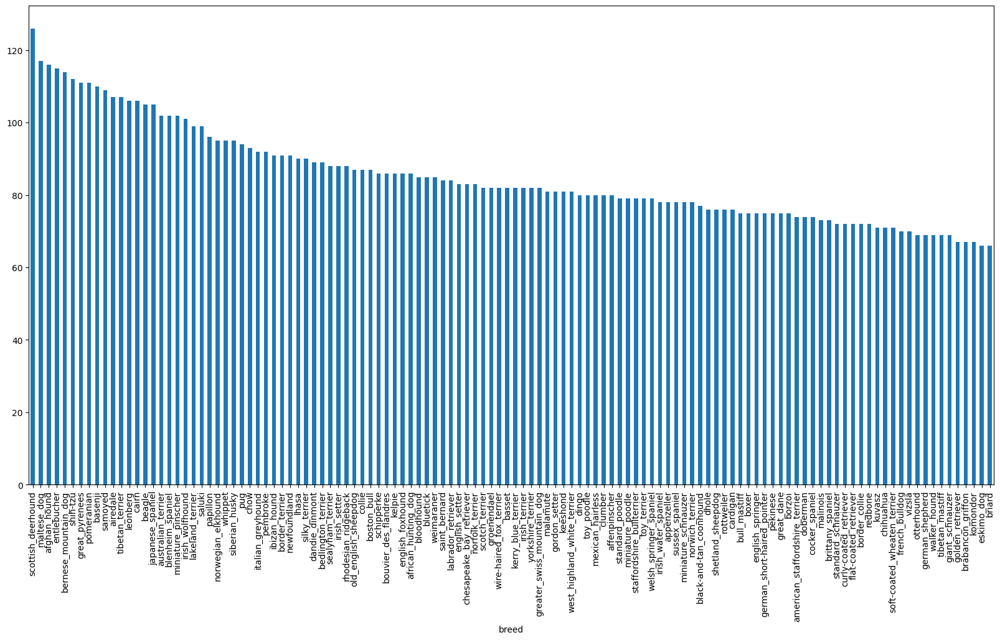

In [18]:
# How many images are there of ecah breed?
labels.breed.value_counts().plot.bar(figsize=(20,10))

In [19]:
 labels.breed.value_counts().median()

82.0

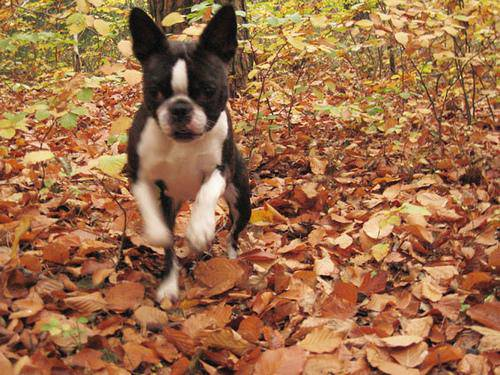

In [20]:
# Let's view an image
from IPython.display import Image
Image("/content/drive/MyDrive/Colab_Notebooks/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

### Getting images and their labels

Let's get a list of all of our image file pathnames .



In [21]:
# Create pathnames from image ID's

filenames = ["/content/drive/MyDrive/Colab_Notebooks/data/train/"+fname+".jpg" for fname in labels.id]
filenames[:5]

['/content/drive/MyDrive/Colab_Notebooks/data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab_Notebooks/data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [22]:
# check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab_Notebooks/data/train/"))==len(filenames):
  print("Filenames match actual amount of files")
else:
  print("Filenames don't match actual amount of files")

Filenames match actual amount of files


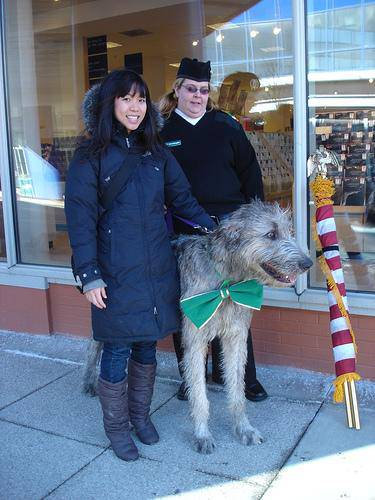

In [23]:
# One more check
Image(filenames[999])

Since we've now got our trading image filepaths in a list , let's prepare our labels.

In [24]:
import numpy as np
labels = labels.breed.to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [25]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [26]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [27]:
# Turn evry label into a boolean array
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [28]:
# Example : Turing boolean array into integes
print(labels[0]) # Orginal label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset form Kaggle doesn't come with a
validation set, we're going to create our own

In [29]:
# Setup X & y variabels
X = filenames
y = boolean_labels

In [30]:
len(filenames),len(boolean_labels)

(10222, 10222)

we're going start off experimenting with ~1000 images and increase as needed .

In [31]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type : "slider", min:1000 , max:10000, step:100}

In [32]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and balidation of total size NUM_IMAGES
X_train , X_val , y_train , y_val = train_test_split(X[:NUM_IMAGES],
                                                     y[:NUM_IMAGES],
                                                     test_size =0.2,
                                                     random_state=42)
len(X_train) , len(y_train) , len(X_val) , len(y_val)

(800, 800, 200, 200)

In [33]:
X_train[:2] , y_train[:2]

(['/content/drive/MyDrive/Colab_Notebooks/data/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab_Notebooks/data/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, 

## Preprocessing Images (tuning images into Tensors)

To preprocess our images into Tensors we're going to write a fuunction which does a few things:
1. Take an image filepath as input
2. USe TensorFlow to read the file and save it to a variable , `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convert color cahnnel values from 0-225 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modefied `image`

In [34]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images

def process_image(image_path):
  """
  Takes an image file path and turns the image a Tensor .
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # Tern the jpg image into numerial Tensor with 3 colour channels (RGB)
  image = tf.image.decode_jpeg(image , channels=3)
  # Convert the colur cahnnel values from 0_225 to 0_1 values
  image = tf.image.convert_image_dtype(image , tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image , size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches
why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go ... they all might not fut into memory.
go... they all might not fit into memory.

So that's wy we do about 32 (this is the batch size)
images at a time (you can manually adjust the batch size) images at a time (you van manually adjust the batch size if need be) .

In order to usse TensorFlow effectibely , we need our data in the form of Tensor tuples which look lije this :

In [35]:
# Create a simple fucntion to return a tuple (image , label)
def get_image_label(image_path , label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and return a typle of (image,label)
  """
  image = process_image(image_path)
  return image, label

In [36]:
get_image_label(X[1],y[1])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.22176053, 0.1532646 , 0.12077089],
         [0.24290617, 0.17007563, 0.12532842],
         [0.25025794, 0.16272292, 0.10750583],
         ...,
         [0.4866906 , 0.31810698, 0.18481737],
         [0.46775866, 0.32910115, 0.20204483],
         [0.36027768, 0.2283099 , 0.11981372]],
 
        [[0.22331059, 0.14479166, 0.10454448],
         [0.20956516, 0.13433544, 0.08120592],
         [0.20576334, 0.11818807, 0.06297097],
         ...,
         [0.34747207, 0.21052358, 0.10098223],
         [0.25428382, 0.14531395, 0.05989731],
         [0.22268865, 0.11715643, 0.03506609]],
 
        [[0.21673436, 0.12777252, 0.0741048 ],
         [0.20701681, 0.11805496, 0.05878148],
         [0.22288738, 0.12433178, 0.0666433 ],
         ...,
         [0.19956292, 0.10319562, 0.05528758],
         [0.24323113, 0.17113218, 0.12510629],
         [0.17322923, 0.11525137, 0.08183777]],
 
        ...,
 
        [[0.71888185, 0.40606675

Now we've got a way to turn our data into tuples of Tensors in the form: `(image, label)` , let's make a function to turn all of our data (`x` ,`y`) into batches .

In [37]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X,y=None , batch_size = BATCH_SIZE , valid_data=False , test_data=False):
  """
  Creates batches of data our of image (X) and label (y) pairs.
  Shuffles the data if it's training data bu doesn't shuffle if it's validation data.
  Also accespts test data as impute (no labels).

  """

  #If the data is a test dtaset, we probablu don't have labels
  if test_data:
    print ("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))  # only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size)
    return data_batch

  # If data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print ("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((X,
                                              y))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

  else:
    print ("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                              tf.constant(y)))
     # Shufflin pathnames and labels befot mapping image proccesor function is faste than shuffling images
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(batch_size)
    return data_batch

In [38]:
# Create training and validation
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)
val_data

Creating training data batches...
Creating validation data batches...


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

## Visualizing  data Batches

Our data is now batches , however , these can be a little hard to understand/comprehend,let's visualize that.

In [39]:
import matplotlib.pyplot as plt
# Create a fucnction for viewing images in a data batch
def show_25_images(images,label):
  """
  Displeys a plot of 25 images and their labels from data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop  through 25 (for displaying 25 images)
  for i in range (25):
    # Create subplots
    ax = plt.subplot(5,5,i+1)
    # Display na image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[label[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [40]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[2.44929940e-01, 3.21496814e-01, 3.47083300e-01],
          [3.08169663e-01, 3.94768178e-01, 4.53139395e-01],
          [4.69041824e-01, 5.70486128e-01, 6.71930432e-01],
          ...,
          [2.23793000e-01, 2.08450139e-01, 1.94294751e-01],
          [2.19752952e-01, 2.00145110e-01, 1.84458837e-01],
          [2.19531000e-01, 1.96194261e-01, 1.76779091e-01]],
 
         [[2.44902104e-01, 3.40901852e-01, 3.65502089e-01],
          [3.23274612e-01, 4.20359641e-01, 4.78579044e-01],
          [4.02817518e-01, 5.06771445e-01, 6.06960952e-01],
          ...,
          [1.60626665e-01, 1.60848171e-01, 1.41611040e-01],
          [1.92279324e-01, 1.87167287e-01, 1.67559445e-01],
          [1.70346022e-01, 1.58015326e-01, 1.34961605e-01]],
 
         [[1.96286887e-01, 3.12715173e-01, 3.44552666e-01],
          [4.70570505e-01, 5.83435118e-01, 6.39177442e-01],
          [3.49762857e-01, 4.68889266e-01, 5.62941968e-01],
          ...,
          [1.12024091e-01, 1.22173063e-01, 9.9410

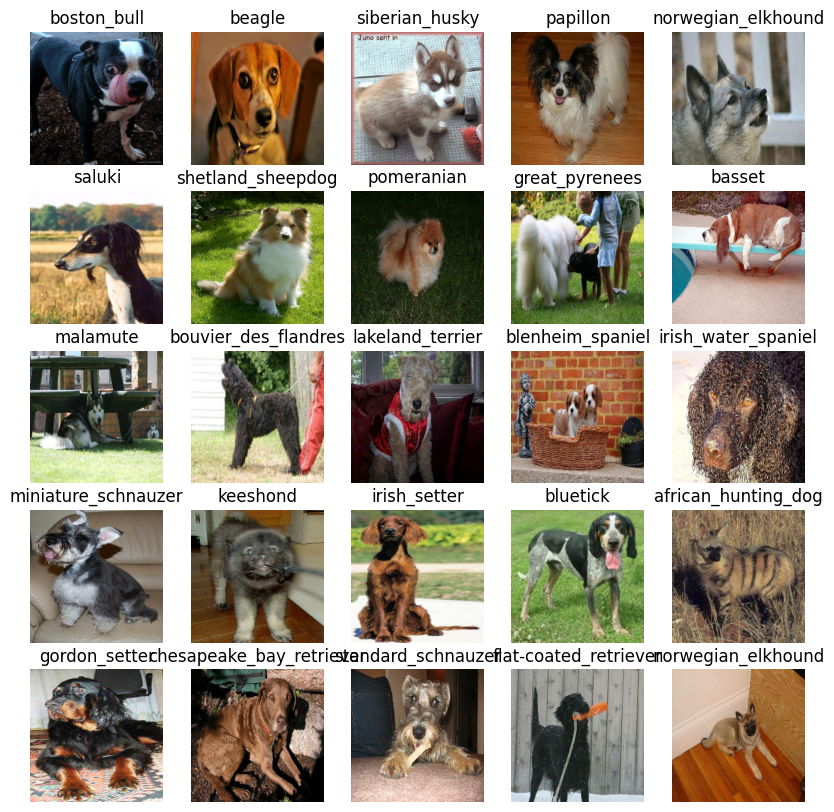

In [41]:
 show_25_images(train_images,train_labels)

In [42]:
# Now let's wisualize our validarion set
val_images, val_labels = next(val_data.as_numpy_iterator())
val_images


array([[[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],

        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],

        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],

        ...,

        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.9427856 ]

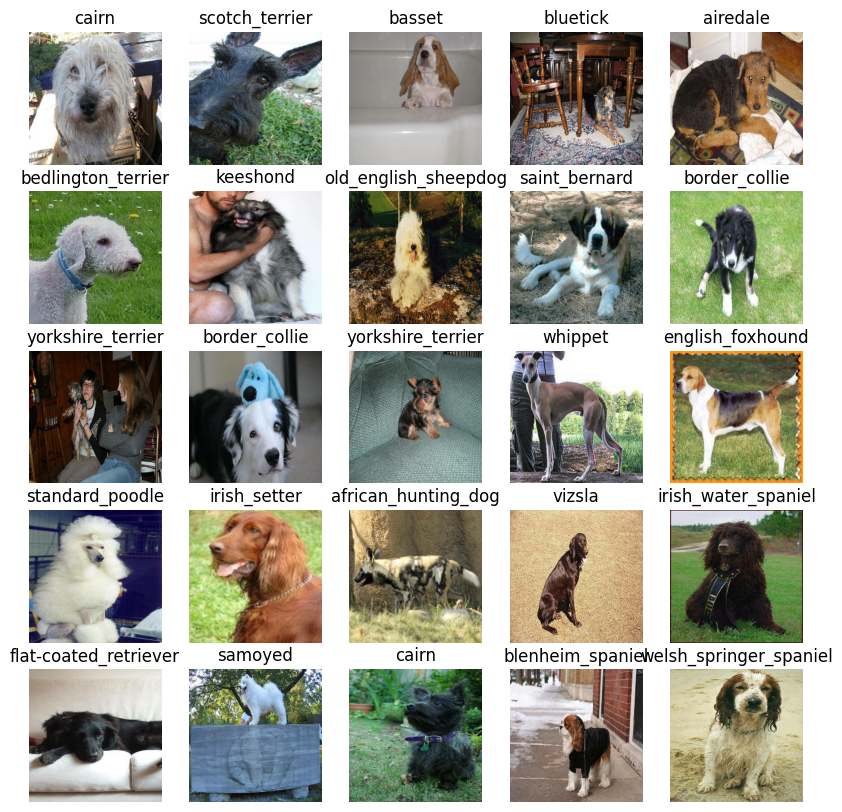

In [43]:
 show_25_images(val_images,val_labels)

## Building a modoel

Before we build a model, there  are a few things  we need to define:
*  The input shape (our images shape , in the form of Tensors ) of our model.
*  The ouput shape (image label , in the form of Tensors) of our model.
*  THe URL of the model we want to use from TensorFlow hub .


In [44]:
# Setup input to the model
INPUT_SHAPE = [None , IMG_SIZE , IMG_SIZE , 3] # batch , heigth , width , colour chanenls

# Setup output shape of our model
OUTPUT_SHAPE= len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL  =  "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

# Let's put them together into a keras deep learning model !
Knoqing thia , let's create a fuction wich:
*  Takes the input shape, output shape and the model we've chosen as parameters.
*  Defines the layers in a keras model in sequential fashion (do this first, then this , then that) .
*  compile the model (says it should be evaluated and improved).
*  Return the model .
 All of these steps can be found here : https://www,tensorflow.org/guide/keras/overviw

In [45]:
# Create a function wich builds Keras model
def create_model(inpute_shape =INPUT_SHAPE, output_shape = OUTPUT_SHAPE ,model_url=  MODEL_URL) :
   print ("Building model with : ", model_url)

   # Setup the model layers
   model = tf.keras.Sequential([
      hub.KerasLayer(model_url) , # Layer 1 (inpute layer)
      tf.keras.layers.Dense(units = output_shape,
      activation = "softmax")  # layer 2 (output laayer)
   ])

   # Compile the model
   model.compile(
       loss =  tf.keras.losses.CategoricalCrossentropy(),
       optimizer = tf.keras.optimizers.Adam(),
       metrics = [ "accuracy"]

   )

   # Build the model
   model.build(inpute_shape)

   return model

In [46]:
model = create_model()
model.summary()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


 ## Creating callbacks
 Callbacks are helper functions a model can use during trainning to do such things as save its progress, check it progress or stop training if model stops improving  .

 we'll create two callbacks , one for TensorBord which helps track prevents our model from training for too long .

### TensorBoard Callback

To setup a TensorBoard callback , we need to do 3 things :
1. Load the TensoBoard notebook extension .
2. Create a TensoBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function .
3. Visualize our models trainning logs with the `%tensorboard` magic function (we'll do this after model training ).

In [47]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [48]:
import datetime

# Create a fucnction to build TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/logs",
                        # Make it so te logs get tracked whenever we run an experimer
                        datetime.datetime.now().strftime("%y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)



### Early stoping callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving

In [49]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping (monitor = "val_accuracy",
                                                   patience = 3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images , to make sure everything is working .

In [50]:
NUM_EPOCH = 100 #@param {type : "slider", min:10 , max:100, step:5}

Let's create a function which trains a model.

*  Create a modek using `create_model()`
*  Setup a TensorBoard callback using `create_tensorboard_callback()`
*  Call the `fit()` function on our model passing it the training data , validation data, number of epochs to train for (`NUM_EPOCH`) and the callbacks we'd like to use
*  Return the model

In [51]:
# Build a function to train and return a trainded model
def train_model():
  """
  Trains a given model and returns the trainded version .
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it th callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCH,
            validation_data = val_data,
            validation_freq = 1 ,
            callbacks = [tensorboard , early_stopping]
            )

  return model

In [11]:
# Fit the model to the data
model = train_model()

NameError: name 'create_model' is not defined

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will acccess the logs directory we created earlier and visualize its contents.

In [12]:
%tensorboard --logdir /content/drive/MyDrive/Colab_Notebooks/logs

<IPython.core.display.Javascript object>

## Making and evaluating predicting using a trained model

In [13]:
val_data

NameError: name 'val_data' is not defined

In [ ]:
# Make prediction on the validation data (note used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

In [ ]:
predictions.shape

In [ ]:
np.sum(predictions[0])

In [ ]:
# First prediction
index = 0
print(predictions[index])
print(f"Max value (probability of prediction) : {np.max(predictions[index])}")
print(f"Sum : {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"predicted label: {unique_breeds[np.argmax(predictions[index])]}")

Having the above functionality is great but we want to be able to do it at scale .
And it would be even better if we could see the image the prediction is being made on!

**Note:**  prediction probabilities are aslo know as confidence level.

In [123]:
# Turn prediction probilities into their  respective label
def get_pred_label(pred_proba):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(pred_proba)]


In [124]:
pred_label = get_pred_label(predictions[9])
pred_label

NameError: name 'predictions' is not defined

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth label).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(batch_data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of
  images and labels.
  """
  images_ = []
  labels_ = []
  for image,label in batch_data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_,labels_

val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

Now we've got ways to get :
*  prediction labels
*  Validation labels (Truth labels)
*  Validation images

Let's make some function to make these all a bit more visaulize

In [ ]:
def plot_pred(prediction_prob , labels , images,n=40):
  """
  View the prediction , ground truth and images for sample n
  """
  pred_prob , true_label , image = prediction_prob[n], labels[n],images[n]
  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Cahnge the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label :
    color = "green"
  else :
    color = "red"

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                   np.max(pred_prob)*100,
                                   true_label),
                                   color=color)
  return

In [ ]:
plot_pred(prediction_prob = predictions,
          labels = val_labels,
          images = val_images,
          n=3)

Now we've got one function to visualize our models to prediction , let's maek another to view our models top 10 predictions .


In [55]:
def plot_pred_conf(prediction_probabilites, label, n=1) :
  """
  plus the top 10 heighst prediction confidences along with the truth label for sample n.
  """

  pred_prob , true_label = prediction_probabilites[n] , labels[n]

  # Get the prediced label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[::10][::-1]
  # Finde the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "gray")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  # Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    #top_plot[(top_10_pred_labels == true_label)].set_color("green")
    pass
  else:
    pass


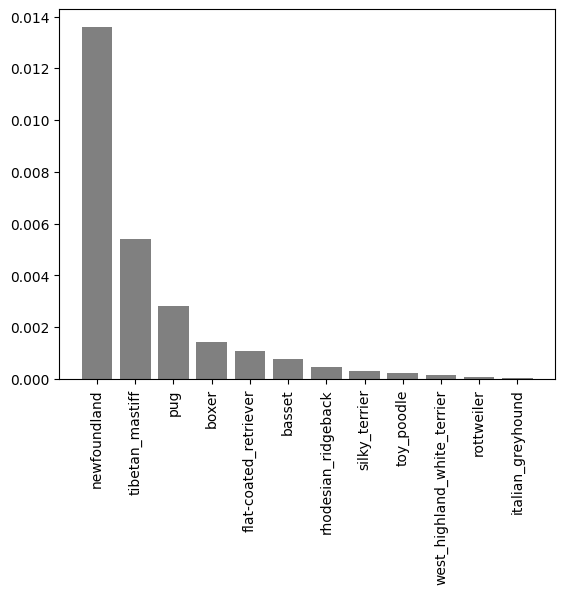

In [56]:
plot_pred_conf(prediction_probabilites = predictions,
                label = val_labels,
                n=8)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

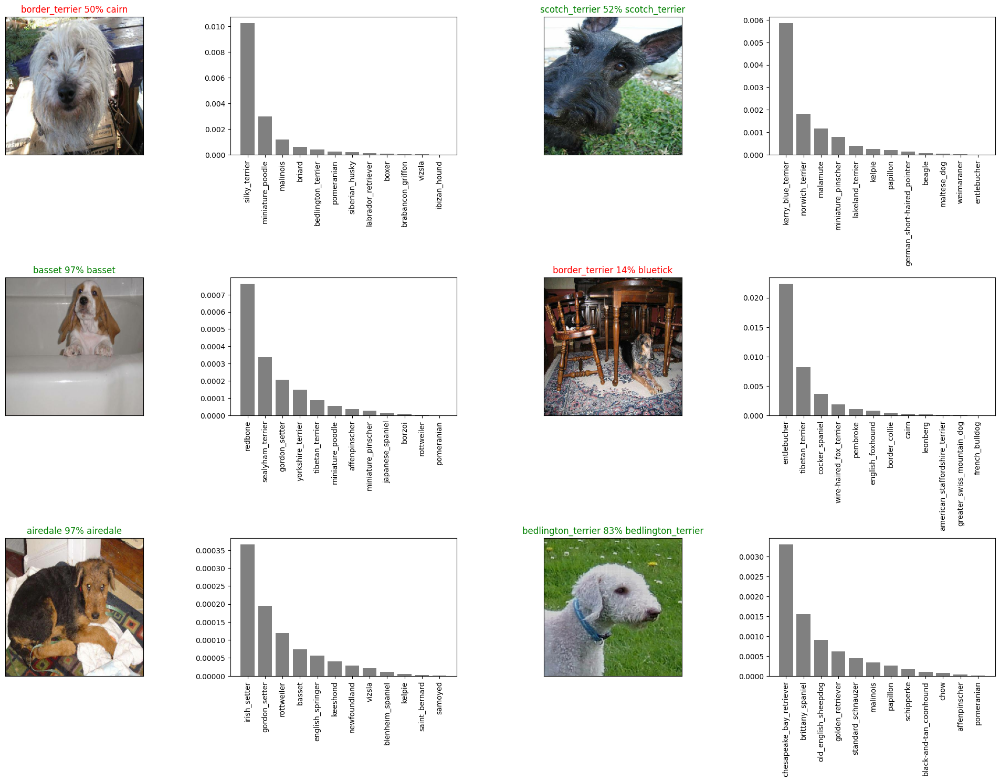

In [57]:
# Let's check out a few predictions and their different values
i_multioplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize =(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows,2*num_cols, 2*i+1)
  plot_pred(prediction_prob = predictions,
            labels = val_labels,
            images = val_images,
            n=i+i_multioplier)
  plt.subplot(num_rows,2 * num_cols , 2*i+2)
  plot_pred_conf(prediction_probabilites = predictions,
                 label = val_labels,
                 n=i+i_multioplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [54]:
# Confusion matrix
pred = [(unique_breeds[np.argmax(predictions[i])]) for i in range(len(predictions))]

tf.math.confusion_matrix(
    labels=tf.convert_to_tensor(val_labels),
    predictions=tf.convert_to_tensor(pred),
)

UnimplementedError: {{function_node __wrapped__Cast_device_/job:localhost/replica:0/task:0/device:CPU:0}} Cast string to int64 is not supported [Op:Cast] name: 

## Saving and reloading a trained model

In [58]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a govel model in a models directory and appends a suffix (string) .
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/drive/MyDrive/Colab_Notebooks/models",
                          datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  model_path = modeldir + "-"+ suffix + ".h5" # the save format
  print(f"Saving model to {model_path}...")
  model.save(model_path)
  return model_path

In [64]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from { model_path}..")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [65]:
 # Save our model trainded on 1000 images
 save_model(model, suffix="1000-images-mobilenetv2-Adam")


Saving model to /drive/MyDrive/Colab_Notebooks/models/240501-165843-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/drive/MyDrive/Colab_Notebooks/models/240501-165843-1000-images-mobilenetv2-Adam.h5'

In [66]:
# Load a model
loaded_model = load_model(model_path="/drive/MyDrive/Colab_Notebooks/models/240501-160951-1000-images-mobilenetv2-Adam.h5")

Loading saved model from /drive/MyDrive/Colab_Notebooks/models/240501-160951-1000-images-mobilenetv2-Adam.h5..


Training a model on the full training data

In [74]:
len(X),len(y)

(10222, 10222)

In [52]:
# Create a data batch with the full data set
full_data = create_data_batches(X,y)

Creating training data batches...


In [53]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [54]:
# Create a model for full model
full_model = create_model()

Building model with :  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [55]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training oon all the data , so we can;t monitor validation accuracy
full_modle_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [56]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCH,
               callbacks=[full_model_tensorboard,full_modle_early_stopping])

Epoch 1/100
320/320 [==============================] - 185s 422ms/step - loss: 1.3379 - accuracy: 0.6691
Epoch 2/100
320/320 [==============================] - 41s 129ms/step - loss: 0.3967 - accuracy: 0.8832
Epoch 3/100
320/320 [==============================] - 41s 129ms/step - loss: 0.2385 - accuracy: 0.9348
Epoch 4/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1495 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1073 - accuracy: 0.9778
Epoch 6/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0774 - accuracy: 0.9852
Epoch 7/100
320/320 [==============================] - 45s 140ms/step - loss: 0.0584 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0455 - accuracy: 0.9940
Epoch 9/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0384 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 42s 132

In [61]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to /drive/MyDrive/Colab_Notebooks/models/240501-165504-full-image-set-mobilenetv2-Adam.h5...


'/drive/MyDrive/Colab_Notebooks/models/240501-165504-full-image-set-mobilenetv2-Adam.h5'

In [106]:
# Load in the full model
loaded_full_model = load_model("/drive/MyDrive/Colab_Notebooks/models/240501-165504-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from /drive/MyDrive/Colab_Notebooks/models/240501-165504-full-image-set-mobilenetv2-Adam.h5..


## Making a prediction on test dataset
Since our moodel has been trained on images in the from of Tensor batches , to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filename as input and covert them into Tensor batches.


In [71]:
# Load test image filenames
test_path = 'drive/MyDrive/Colab_Notebooks/data/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab_Notebooks/data/test/e8db9ef8056880a187f3768565f215d9.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8e42d4a1a18d4168bac9a69922df22f.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8e5d64a1789dd86009b07003bed090b.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8e68264f76c3398ecb6c67b9bb52833.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8e6e731b4afb84faf9c022a67935867.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8eca3dc497d4bb15b0254bc9f56cdd7.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8f100fcc80e9c987999a1ace2d18bc3.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8f51d54d179b05ea4cc9c726cae9229.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8f67d8d36c49d7436aab680e798b685.jpg',
 'drive/MyDrive/Colab_Notebooks/data/test/e8fcfd7898f198f6efe756a6f93bc0fc.jpg']

In [72]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [73]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [76]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 2000s 6s/step


In [79]:
# Save predictions (NumPy array) to csv file
np.savetxt("drive/MyDrive/Colab_Notebooks/preds_array.csv",test_predictions, delimiter=",")

In [80]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Colab_Notebooks/preds_array.csv", delimiter=",")

In [82]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probability outputs in a DataFrame with and ID and a column for each different dog breed .

In [83]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [87]:
# Append test images Id's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [90]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions

In [91]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e8db9ef8056880a187f3768565f215d9,1.594880e-08,9.192280e-07,3.719979e-09,1.138326e-06,6.755562e-11,5.543021e-06,1.039001e-08,1.534895e-09,3.197695e-07,...,3.667122e-09,8.830272e-09,1.518174e-07,1.231887e-05,1.370626e-08,8.434203e-01,3.081063e-08,4.235075e-08,8.180736e-07,7.076543e-07
1,e8e42d4a1a18d4168bac9a69922df22f,6.269804e-08,6.171725e-09,9.152558e-08,9.700924e-11,5.525172e-12,4.733874e-06,1.249340e-10,1.144741e-10,1.328590e-09,...,5.857092e-07,1.791241e-08,5.284877e-10,2.301860e-06,2.206200e-08,1.678176e-06,3.983407e-08,1.588665e-09,1.056415e-10,5.205325e-10
2,e8e5d64a1789dd86009b07003bed090b,7.299123e-08,1.773178e-13,7.188633e-12,1.067548e-12,2.332734e-09,5.694316e-07,5.102911e-07,3.747874e-09,9.987132e-08,...,2.841493e-09,3.887820e-08,2.568500e-09,1.668330e-08,3.679296e-10,9.935129e-01,6.261720e-08,4.849591e-09,5.452280e-10,4.366219e-06
3,e8e68264f76c3398ecb6c67b9bb52833,6.516940e-11,4.997945e-13,2.298987e-10,1.956417e-13,4.666323e-10,5.132339e-10,1.188865e-09,3.154218e-06,2.591915e-10,...,1.855376e-08,1.380510e-06,1.107928e-11,1.135474e-12,1.159107e-11,2.762801e-11,5.683740e-12,3.851467e-10,2.116861e-09,5.343767e-13
4,e8e6e731b4afb84faf9c022a67935867,2.785122e-12,1.607436e-14,2.540151e-13,1.207632e-11,3.164209e-04,1.069468e-11,7.582731e-11,4.695373e-11,1.263392e-13,...,3.886498e-10,4.254358e-13,2.891643e-11,2.442995e-11,6.778414e-13,3.337723e-13,9.091548e-13,6.780269e-11,1.016617e-10,1.292763e-09


In [93]:
# Save our predictions DataFrame
preds_df.to_csv("drive/MyDrive/Colab_Notebooks/full-model-predictions-submission-mobilenetv2.csv",
                index=False)

## Make predictions on custom images

In [117]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Colab_Notebooks/my-images/"
custom_images_paths = [ custom_path + fname for fname in os.listdir(custom_path)]

In [118]:
custom_images_paths=custom_images_paths[:1]
custom_images_paths

['drive/MyDrive/Colab_Notebooks/my-images/images3.jpg']

In [119]:
# Turn custom images into batch
custom_data = create_data_batches(custom_images_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [120]:
# Make predictions
custom_preds = loaded_full_model.predict(custom_data)
custom_preds

1/1 [==============================] - 1s 832ms/step


array([[2.45882585e-08, 1.44344189e-11, 9.21624062e-12, 2.07447167e-12,
        1.02083245e-10, 1.37014428e-11, 8.48611546e-14, 2.06988038e-11,
        1.09385098e-10, 2.12350276e-10, 1.07032274e-11, 2.22028364e-12,
        5.24822896e-09, 7.54255200e-11, 3.77575089e-11, 1.72383132e-11,
        1.91596472e-09, 4.53892202e-10, 9.07138253e-12, 5.41194511e-09,
        4.73794892e-11, 2.20886746e-11, 9.46314742e-08, 2.22138710e-10,
        2.26313916e-11, 3.44799241e-06, 1.20437896e-11, 4.30193684e-12,
        1.13922712e-10, 1.88984273e-10, 3.13474118e-08, 5.77478620e-11,
        5.13481510e-13, 3.06903773e-11, 1.42320156e-10, 1.71053297e-12,
        2.38333442e-12, 6.54586246e-11, 2.24826255e-10, 4.67189308e-11,
        3.19468925e-13, 9.13865554e-13, 2.54159221e-10, 4.67038734e-11,
        4.16068868e-09, 2.99020435e-08, 1.17852145e-10, 5.15028131e-10,
        7.55619234e-10, 1.42180625e-11, 2.57266378e-11, 5.76520082e-11,
        1.28337896e-10, 7.12819615e-13, 2.36806998e-11, 2.545580

In [125]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['pug']

In [126]:
# Get custom images
custom_images =[]
# Loop through unbathced data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

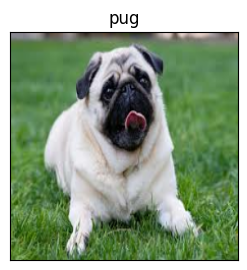

In [128]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)